In [1]:
import os
import sys
import time as t_util
import numpy as np
import yaml
import cftime
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib
import mplotutils as mpu
import cartopy.crs as ccrs
import cartopy.feature as cfeature


In [2]:
#Read main path
with open('../path_main.txt', 'r') as file:    path_main = file.read()

dir_HWMId   = f'{path_main}Data/Plot_preparation/HWMId/EURO-CORDEX_Europe/'
dir_YearMax = f'{path_main}Data/EURO-CORDEX/Yearmax/'
dir_names   = f'{path_main}Scripts/Model_lists/'
dir_scripts = f'{path_main}Scripts/'
dir_fig     = f'{path_main}Figures/Paper_v2/'
if not os.path.exists(dir_fig): os.mkdir(dir_fig)
    

## Prepare variables and parameters

In [3]:
#Define models and RCPs which should be used
all_models = []
with open(dir_names + 'Models_CORDEX-EUR-11_RCP85.txt', 'r') as filehandle:
    for line in filehandle:
        all_models.append(eval(line[:-1]))

#Load city coordinates
fname_coords = dir_scripts + 'City_coordinates.yml'
with open(fname_coords, 'r') as file:
    city_coords = yaml.safe_load(file)

#Define cities
cities = ['Lisbon', 'Madrid', 'Barcelona', 'Rome', 'Athens', 'Istanbul', 'Sofia', 'Bucharest', 'Belgrade',
          'Zagreb', 'Milan', 'Budapest', 'Munich', 'Vienna', 'Prague', 'Paris', 'Brussels', 'Amsterdam',
          'London', 'Dublin', 'Hamburg', 'Copenhagen', 'Berlin', 'Warsaw', 'Kharkiv', 'Kyiv', 'Minsk','Vilnius', 
          'Riga', 'Moscow', 'NizhnyNovgorod', 'Kazan', 'SaintPetersburg', 'Helsinki', 'Stockholm', 'Oslo']

#Define scenario and EMT
RCP     = 'rcp85'
EMT_sel = '3.0K'


## Plot

In [ ]:
#Create figure
fig, axes = plt.subplots(1, 2, figsize=(11, 5), subplot_kw=dict(projection=ccrs.RotatedPole(pole_latitude=39.25, pole_longitude=-162)))
plt.subplots_adjust(wspace=0.1)

#Select HSI
var_HWMID = 'TX'
var_IQR   = 'TXx'

#Loop over HWMId and TXx variability
for sel in range(0,2):

    ax = axes[sel]
    
    #Add coastlines and set extent
    ax.coastlines(resolution='50m', linewidth=0.5, color='k')
    ax.add_feature(cfeature.LAKES, linewidth=0.5, edgecolor='k', facecolor='none')
    ax.set_extent([-7.5, 39, 33, 65], crs=ccrs.PlateCarree())
    
    if sel==0:
        fname_in = dir_HWMId + 'HWMId-' + var_HWMID + '_all_models_' + RCP + '_EMT' + EMT_sel + '.nc'
        variab = 'HWMID'
        vmax = 30
        cmap = 'Reds'
        title = 'HWMId-' + var_HWMID + ' at $\Delta$EMT=3°C'
        label = 'HWMId'
    else:
        fname_in = dir_YearMax + var_IQR + '-IQR_all_models.nc'
        variab = var_IQR
        vmax = 3
        cmap = 'viridis'
        title = 'Interannual variability of ' + var_IQR + '\n(1981-2010)'
        label = 'IQR of ' + variab
    
    #Read data and calculate MMM
    data = xr.open_dataset(fname_in)
    data_plot = data[variab].median('model')

    #Plot
    h1 = ax.pcolormesh(data.lon, data.lat, data_plot, transform=ccrs.PlateCarree(), vmin=0, vmax=vmax, cmap=cmap)

    #Set title
    ax.set_title(title, fontsize=14, pad=25, va='center')

    #Colorbar
    cbar = mpu.colorbar(h1, ax, orientation='horizontal', extend='max', size=0.06, shrink=0.2, pad=0.05)
    cbar.ax.tick_params(labelsize=10)
    cbar.set_label(label, fontsize=14, labelpad=10)

    #Get coordinates of cities and add scatter
    coords = np.array([city_coords[city] for city in cities])
    ax.plot(coords[:, 1], coords[:, 0], 'o', transform=ccrs.PlateCarree(),
            markeredgewidth=1.0, markersize=4, markeredgecolor='k', markerfacecolor='none')

#Save in file
fig.savefig(dir_fig + 'FigS5_Map_HWMId_TXx-IQR_EURO-CORDEX.png', dpi=300, bbox_inches='tight')


## Plot single models

/uio/kant/div-cicero-u1/clems/.conda/envs/python38_clems_2021_qbo/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1598: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


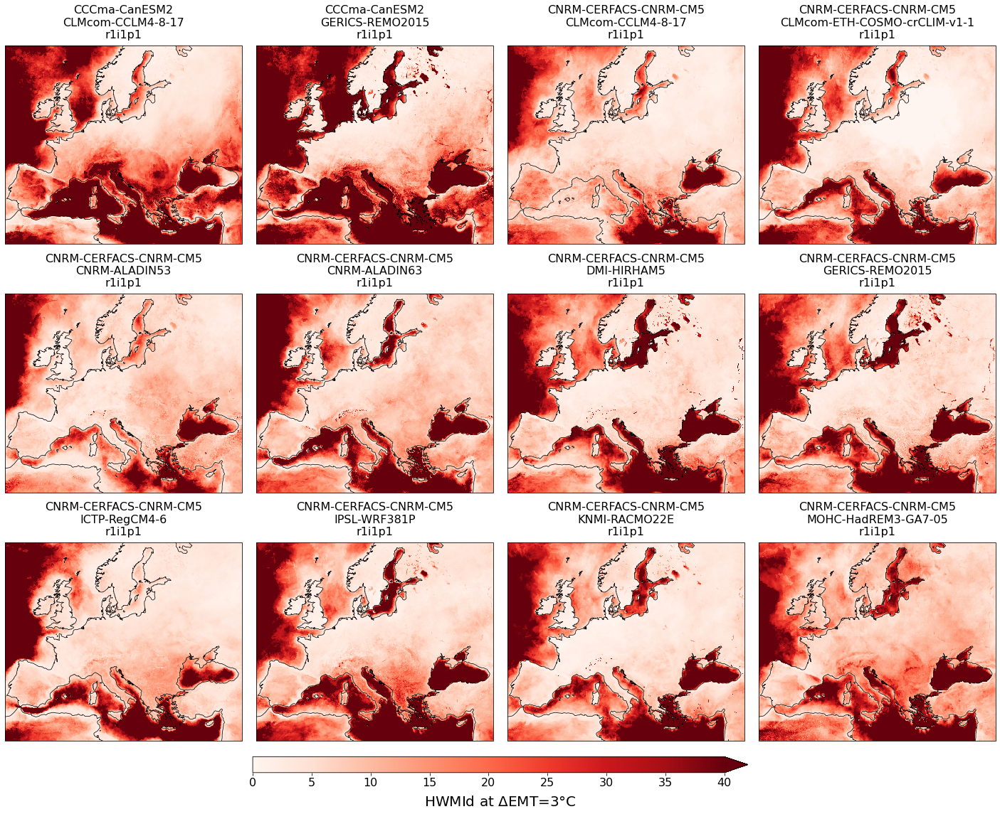

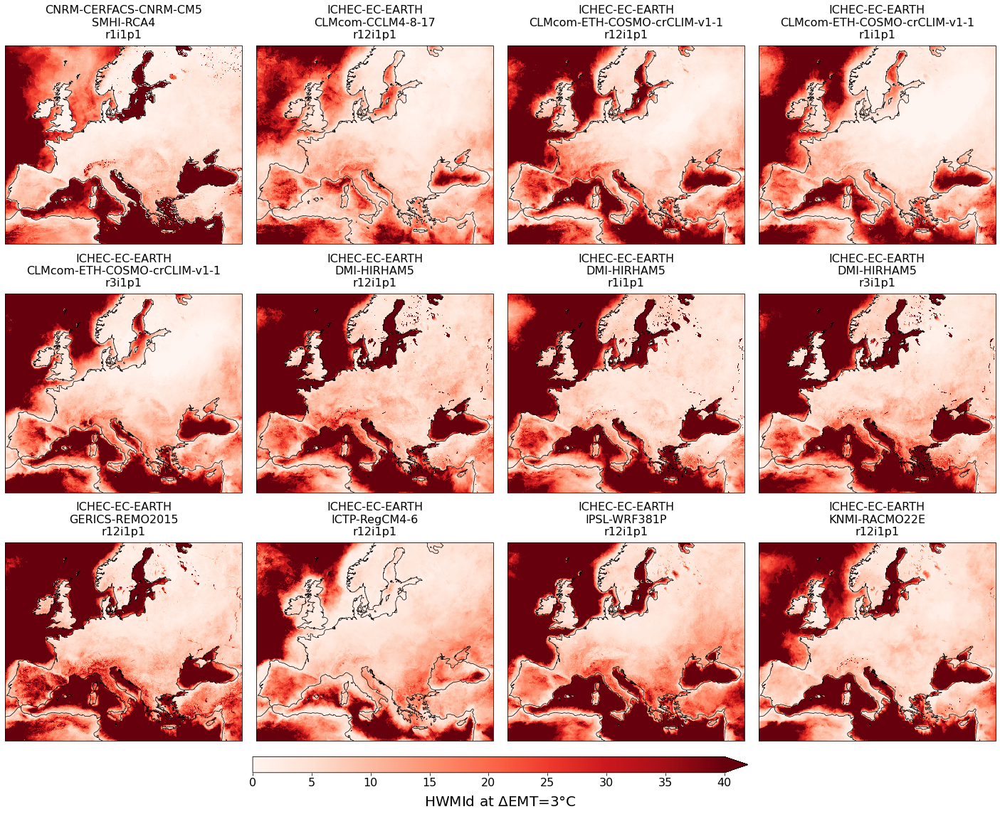

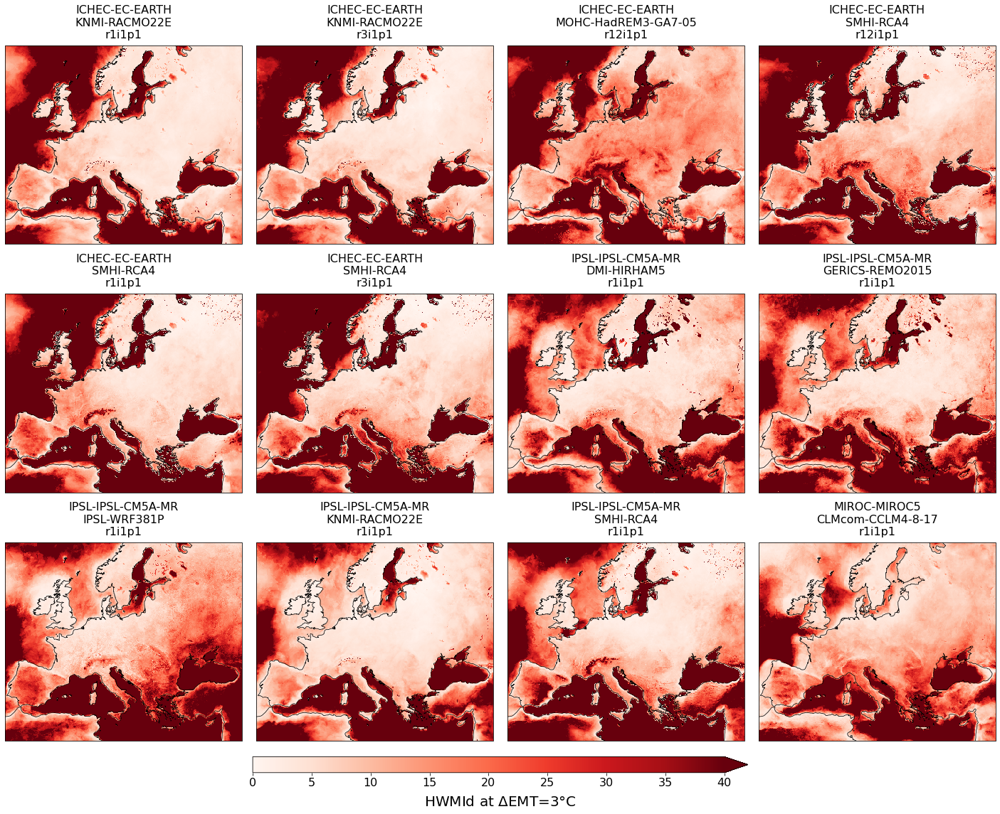

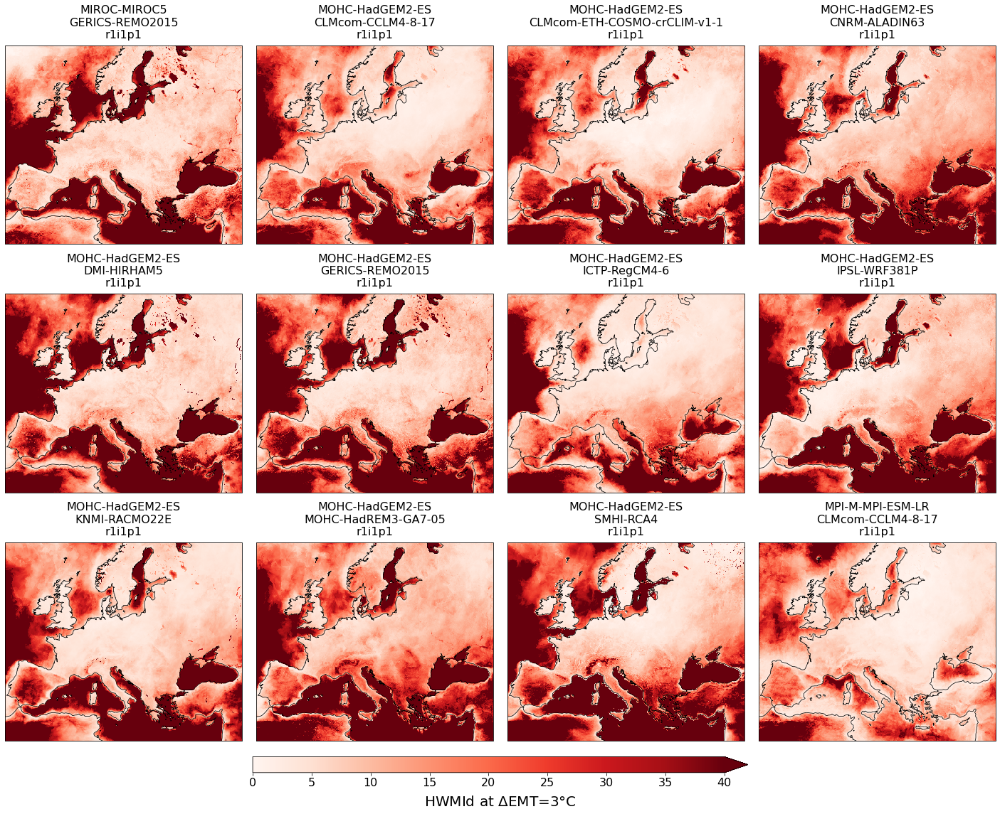

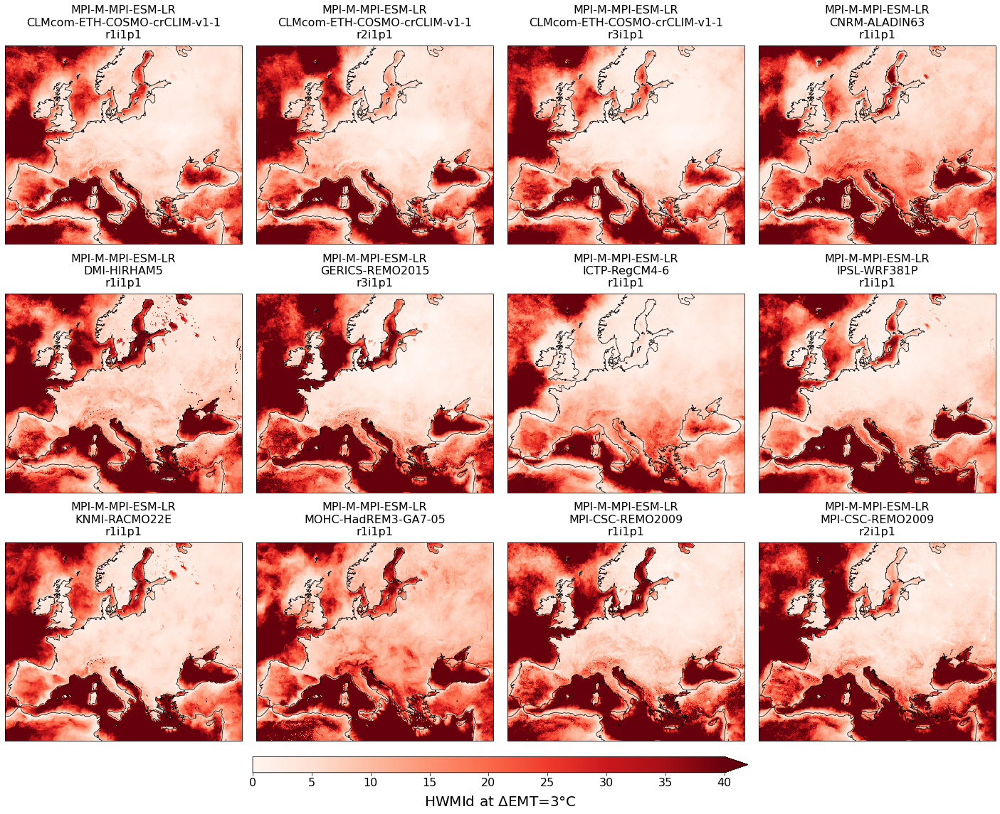

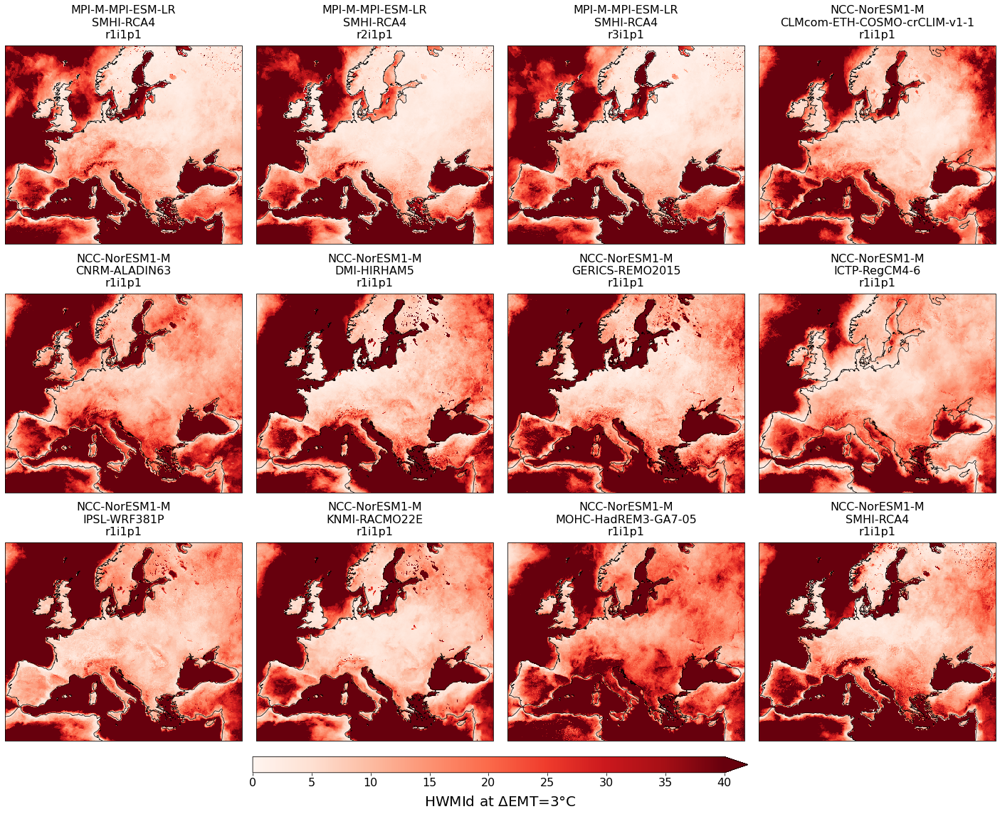

In [5]:
HSI = 'TX'

#Loop over models
i2 = 0
i3 = 0
for i1, model in enumerate(all_models):
    
    #Create figure
    if np.mod(i1,12)==0:
        fig, axes = plt.subplots(3, 4, figsize=(25, 18), subplot_kw=dict(projection=ccrs.RotatedPole(pole_latitude=39.25, pole_longitude=-162)))
        axes = axes.flatten()
        plt.subplots_adjust(hspace=0.25, wspace=0.05)
        i2 = 0
        i3 = i3 + 1
    
    ax = axes[i2]
    
    #Add coastlines and set extent
    ax.coastlines(resolution='50m', linewidth=0.75, color='k')
    ax.set_extent([-7.5, 39, 33, 65], crs=ccrs.PlateCarree())
    
    #Read data
    fname_in = dir_HWMId + 'HWMID-' + HSI + '_' + "_".join(model) + '_' + RCP + '_EMT.nc'
    data  = xr.open_dataset(fname_in)
    
    #Select lon and lat names
    if 'longitude' in data.coords:  lat_name, lon_name = 'latitude', 'longitude'
    elif 'lon' in data.coords:      lat_name, lon_name = 'lat', 'lon'    
    
    #Select data
    val = data['HWMID'].sel(EMT='3.0K')

    #Plot
    h1 = ax.pcolormesh(data[lon_name], data[lat_name], val, transform=ccrs.PlateCarree(), vmin=0, vmax=40, cmap='Reds')

    #Set title
    ax.set_title("\n".join(model), fontsize=16, pad=10)

    #Finalize and save figure
    if i2==11:

        #Colorbar
        cbar = mpu.colorbar(h1, axes[-4], axes[-1], orientation='horizontal', extend='max', size=0.08, shrink=0.5, pad=0.08)
        cbar.ax.tick_params(labelsize=16)
        cbar.set_label('HWMId at $\Delta$EMT=3°C', fontsize=20, labelpad=10)

#         #Save in file
#         fig.savefig(dir_fig + 'FigSx_HWMId-Europe_SingleModels_' + str(i3) + '.png', dpi=300, bbox_inches='tight')

    i2 = i2 + 1
    